## Зависимости

In [200]:
import pandas as pd
import plotly.express as px

In [2]:
!pip install openpyxl -q

## Чтение исходных данных

In [3]:
data = pd.read_excel('data/ai_bot_app_post.xls')
data.head()

,user_id,telegram_id,text,title
0,1,157314,❗️Восстановление аммиакопровода Тольятти — Оде...,Восстановление аммиакопровода займет до 3 меся...
1,2,18940,Дополнительные 39 миллионов рублей были выделе...,Выделены дополнительные 39 млн рублей на соцуч...
2,3,4868,«Россия уничтожена санкциями»\n ...,«Россия уничтожена санкциями»\n ...
3,4,157315,❗️Правоохранители провели обыски в министерств...,Обыски в минобразования Дагестана по делу о вы...
4,16,157317,"Реконструкция пропускного пункта ""Верхний Ларс...","Реконструкция пропускного пункта ""Верхний Ларс..."


In [4]:
data = data[['text']]
data['text_len'] = data['text'].apply(lambda x: len(str(x)))
data.head()

,text,text_len
0,❗️Восстановление аммиакопровода Тольятти — Оде...,227
1,Дополнительные 39 миллионов рублей были выделе...,573
2,«Россия уничтожена санкциями»\n ...,108
3,❗️Правоохранители провели обыски в министерств...,212
4,"Реконструкция пропускного пункта ""Верхний Ларс...",79


In [31]:
# data['text_len'].hist(bins=50)
fig = px.histogram(data, x='text_len')
fig.show()

In [35]:
fig = px.histogram(data[data['text_len']<1000], x='text_len')
fig.show()

In [7]:
data['text_len'].describe()

count    88182.000000
mean       424.191694
std        463.490812
min          1.000000
25%        127.000000
50%        275.000000
75%        561.000000
max       6460.000000
Name: text_len, dtype: float64

## Второй датасет

In [205]:
data = pd.read_excel('data/posts.xlsx')
data.head()

,id,telegram_id,text,datetime,category_id,channel_id,title,Unnamed: 7,Unnamed: 8,Unnamed: 9
0,1,157314,❗️Восстановление аммиакопровода Тольятти — Оде...,2023-06-07 11:40:06,NaN,-1001394050290,Восстановление аммиакопровода займет до 3 меся...,NaN,NaN,NaN
1,2,18940,Дополнительные 39 миллионов рублей были выделе...,2023-06-07 11:34:56,NaN,-1001098860759,Выделены дополнительные 39 млн рублей на соцуч...,NaN,NaN,NaN
2,3,4868,«Россия уничтожена санкциями»\n ...,2023-06-07 11:03:05,NaN,-1001797434593,«Россия уничтожена санкциями»\n ...,NaN,NaN,NaN
3,4,157315,❗️Правоохранители провели обыски в министерств...,2023-06-07 11:50:06,NaN,-1001394050290,Обыски в минобразования Дагестана по делу о вы...,NaN,NaN,NaN
4,16,157317,"Реконструкция пропускного пункта ""Верхний Ларс...",2023-06-07 12:10:25,NaN,-1001394050290,"Реконструкция пропускного пункта ""Верхний Ларс...",NaN,NaN,NaN


In [206]:
data['category_id'].value_counts()

category_id
,-1001036240821                                                        2
 армию и приграничье                                                   1
,-1001551102382                                                        1
,-1001722167948                                                        1
,-1001117729638                                                        1
,-1001742369677                                                        1
,-1001509508777                                                        1
,-1001127265481                                                        1
,-1001351148479                                                        1
,-1001092413834                                                        1
,-1001338337113                                                        1
 практически все возвращаются обратно из отпусков                      1
База ЧВК "Вагнер" в Республике Беларусь                                1
,-1001117628569                        

Как мы поняли, кроме колонки текст нам ничего не поможет

In [38]:
data = data[['text']]
data['text_len'] = data['text'].apply(lambda x: len(str(x)))
data.head()

,text,text_len
0,❗️Восстановление аммиакопровода Тольятти — Оде...,227
1,Дополнительные 39 миллионов рублей были выделе...,573
2,«Россия уничтожена санкциями»\n ...,108
3,❗️Правоохранители провели обыски в министерств...,212
4,"Реконструкция пропускного пункта ""Верхний Ларс...",79


In [39]:
fig = px.histogram(data, x='text_len')
fig.show()

In [40]:
fig = px.histogram(data[data['text_len']<1000], x='text_len')
fig.show()

Данный датасет более распространен, скорее всего он с повторяющимися новостями(из назавния файлов вроде понятно)

## Наш датасет

In [197]:
class_dataset = pd.read_csv('data/dataset.csv', sep=';')
class_dataset.head()

,"🏁 Итоги дня: 20 сентября 🧸 «Детский мир» объявил о завершении трансформации в частный бизнес: дочернее общество АО ДМФА консолидировало 58% акций по результатам программ приобретения. В скором времени последует Обязательное предложение, после которого планируется ликвидация компании. Смотрим на участие в выкупе как на единственно действующий вариант выхода. Подробнее💎 «АЛРОСА» приостановит продажи алмазов в сентябре и октябре 2023 г. по запросу индийского Совета по содействию экспорту драгоценных камней и ювелирных изделий (GJEPC). Считаем это негативным фактором для свободного денежного потока компании, что может привести к снижению размера дивиденда до 2,2 руб. на акцию (див. доходность около 3%). Сохраняем осторожный взгляд на акции «Алросы» на фоне неблагоприятной конъюнктуры рынка алмазов. Подробнее🍖 Акционеры «Черкизово» одобрили выплату дивидендов в размере 118,43 руб. на акцию по результатам 1П2023 г., что соответствует дивидендной доходности в 2,7%. Сохраняем позитивный взгляд на акции компании на фоне роста доли рынка и возможности повышения цен. По нашим оценкам, акции торгуются с мультипликатором 7x P/E 2023, что соответствует среднему значению за 5 лет. Акции «Черкизово» отреагировали укреплением на 4,3%.#СольДня$DSKY $ALRS $GCHE",Экономика,@omyinvestments
0,🛒 Взгляд на компанию: «Детский мир» завершил т...,Экономика,@omyinvestments
1,⚡️Взгляд на компанию: «Алроса» приостановит пр...,Экономика,@omyinvestments
2,"🟡 Взгляд на сектор: Золотые перспективы на $2,...",Экономика,@omyinvestments
3,⏰ Доброе утро! 20 сентября🇷🇺 Ночное дежурство ...,Экономика,@omyinvestments
4,🏁 Итоги дня: 19 сентября 🩺 Группа «Мать и дитя...,Экономика,@omyinvestments


In [198]:
class_dataset.columns = ['text', 'category', 'chanel']
class_dataset.head()

,text,category,chanel
0,🛒 Взгляд на компанию: «Детский мир» завершил т...,Экономика,@omyinvestments
1,⚡️Взгляд на компанию: «Алроса» приостановит пр...,Экономика,@omyinvestments
2,"🟡 Взгляд на сектор: Золотые перспективы на $2,...",Экономика,@omyinvestments
3,⏰ Доброе утро! 20 сентября🇷🇺 Ночное дежурство ...,Экономика,@omyinvestments
4,🏁 Итоги дня: 19 сентября 🩺 Группа «Мать и дитя...,Экономика,@omyinvestments


In [202]:
fig = px.histogram(class_dataset, x="category", title='Our dataset (26 categories)')

fig.show()

In [203]:
categorys = class_dataset['category'].unique()
categorys = categorys.tolist()
categorys


['Экономика',
 'Технологии',
 'Политика',
 'Шоубиз',
 'Криптовалюты',
 'Путешествия',
 'Образование и познавательное',
 'Развлечения и юмор',
 'Новости и СМИ',
 'Психология',
 'Искусство',
 'Спорт',
 'Цитаты',
 'Еда и кулинария',
 'Блоги',
 'Бизнес и стартапы',
 'Маркетинг, PR, реклама',
 'Дизайн',
 'Право',
 'Мода и красота',
 'Здоровье и медицина',
 'Софт и приложения',
 'Видео и фильмы',
 'Музыка',
 'Игры',
 'Рукоделие']

In [204]:
class_dataset['text_len'] = class_dataset['text'].apply(lambda x: len(str(x)))
fig = px.histogram(class_dataset[class_dataset['text_len']<1000], x='text_len')
fig.show()

Получилось примерно одинаковое распределение

## Тест моделей

In [7]:
data = pd.read_excel('data/posts.xlsx')
data.head()

,id,telegram_id,text,datetime,category_id,channel_id,title,Unnamed: 7,Unnamed: 8,Unnamed: 9
0,1,157314,❗️Восстановление аммиакопровода Тольятти — Оде...,2023-06-07 11:40:06,NaN,-1001394050290,Восстановление аммиакопровода займет до 3 меся...,NaN,NaN,NaN
1,2,18940,Дополнительные 39 миллионов рублей были выделе...,2023-06-07 11:34:56,NaN,-1001098860759,Выделены дополнительные 39 млн рублей на соцуч...,NaN,NaN,NaN
2,3,4868,«Россия уничтожена санкциями»\n ...,2023-06-07 11:03:05,NaN,-1001797434593,«Россия уничтожена санкциями»\n ...,NaN,NaN,NaN
3,4,157315,❗️Правоохранители провели обыски в министерств...,2023-06-07 11:50:06,NaN,-1001394050290,Обыски в минобразования Дагестана по делу о вы...,NaN,NaN,NaN
4,16,157317,"Реконструкция пропускного пункта ""Верхний Ларс...",2023-06-07 12:10:25,NaN,-1001394050290,"Реконструкция пропускного пункта ""Верхний Ларс...",NaN,NaN,NaN


In [14]:
len(data[data['category_id'].isna() == 1])

169860

In [216]:
a = 'Compute cosine similarity btw all <count> sentences and write it to self field - cosine_matrix'
len(a)

94

In [208]:
import torch
torch.cuda.is_available()

True

In [87]:
from sentence_transformers import SentenceTransformer
from simpletransformers.classification import ClassificationModel

from sklearn.metrics.pairwise import cosine_similarity
import pandas as pd
import numpy as np
import re
from scipy.special import softmax

import logging


class Model:
    _use_cuda = False
    _DEVICE = 'cpu'

    def __init__(self, name, path_to_weights, cuda=False) -> None:
        if cuda:
            self._use_cuda = True
            self._DEVICE = 'cuda'

        self.model_for_embeddings = SentenceTransformer(name, device=self._DEVICE)
        self.classifier = ClassificationModel('bert', path_to_weights, use_cuda=self._use_cuda)

        logging.warning(f'\n Model device: {self._DEVICE}')

    def process_data(self, data):
        """
        data: list of sentences

        Compute embeddings and write to self filed - embeddings\n
        Compute cosine similarity btw all <count> sentences and write it to self field - cosine_matrix
        
        return pd.DataFrame with columns: ['text', 'category']
        """

        logging.warning(f'\n Model for embeddings: <MiniLM-L12-v2> \n Model for classification: <trained BERT>')

        data = pd.DataFrame({
            'text': data,
            'category': np.zeros(len(data)),
            'unique': np.ones(len(data))
        })

        data['text'] = data['text'].astype('str').apply(self.clean_text)
        logging.warning('\n Model: text cleaned')

        categorized_data_frame = self.make_classification(data)

        detected_data = self.detect_duplicate(categorized_data_frame)

        proc_data = self.delete_duplicate(detected_data)

        proc_data['category'] = proc_data['category'].apply(self.id2cat)

        proc_data.drop(['unique'], axis=1, inplace=True)

        logging.warning('\n Model: index turned to name')
        logging.warning('\n Model: Its all done')

        return proc_data

    def make_classification(self, data):
        
        logging.warning('\n Classification...')
        predict_classes, raw_outputs = self.classifier.predict(data['text'].values.tolist())

        proba = softmax(raw_outputs, axis=1)

        max_proba = np.partition(proba, -1)[:, -1]
        predict_classes[max_proba < 0.4] = -1

        mask_1 = data['text'].str.contains('купил')
        mask_2 = data['text'].str.contains('продал')
        mask = mask_1 + mask_2
        mask = ~mask
        
        data['proba'] = max_proba
        data['category'] = predict_classes*mask
        
        
        logging.warning(f'\n len predicted: {len(predict_classes)}, unique: {np.unique(predict_classes)}')
        logging.warning('\n Model: categorized done')

        return data

    def detect_duplicate(self, data, t=0.78):
        # индексы, которые удалим
        all_indexes = []

        for category in data['category'].unique():
            temp_data = data[data['category'] == category].reset_index()
            list_of_sentences = temp_data['text'].tolist()

            # получаем эмбединги текстов
            embeddings = self.model_for_embeddings.encode(list_of_sentences)

            # считаем косинусное расстояние между текстами
            cosine = cosine_similarity(embeddings)

            # оставляем только значения выше порога
            cosine = np.where(cosine < t, False, True)

            # индексы, которые потом удалим
            indexes_to_drop = list()

            # выбираем эти индексы
            for i in range(len(cosine)):
                temp_indexes = np.transpose((cosine[i][i + 1:]).nonzero())
                indexes_to_drop.extend(list(temp_indexes + 1))

            # получаем индексы полного датафрейма, а не нашего среза (где только 1 категория новостей)
            true_indexes = (np.where(np.isin(temp_data.index.values, indexes_to_drop), temp_data['index'], -1))

            # удалим дубликаты
            true_indexes = set(true_indexes)

            # удалим -1 - (индекс не является дубликатом)
            true_indexes.remove(-1)

            # добавим во все итоговые индексы
            all_indexes.extend(true_indexes)

        # не будем удалять защищенные индексы
        predicted_indexes = set(self.get_trades(data))
        indexes_to_drop = list(set(all_indexes) - set(predicted_indexes))

        # дропаем
        data.drop(indexes_to_drop, inplace=True)
        data.reset_index(inplace=True, drop=True)

        return data

    def get_trades(self, data):
        contains_kupil = data['text'].str.contains('🟢купил')
        contains_prodal = data['text'].str.contains('⭕️продал')

        k_indexes = contains_kupil.where(contains_kupil == True).dropna().index.values.tolist()
        p_indexes = contains_prodal.where(contains_prodal == True).dropna().index.values.tolist()

        # возвращает индексы
        return k_indexes + p_indexes

    def make_embeddings(self, data):
        embds = self.model_for_embeddings.encode(data)
        return embds

    def delete_duplicate(self, data):
        data = data[data['unique'] == 1]
        logging.warning('\n Model: duplicates are deleted')
        return data

    def clean_text(self, text):
        text = str(text)
        return str(re.sub("[\(\[].*?[\)\]]", "", text))

    def id2cat(self, i: int) -> str:
        categories = ['Экономика', 'Технологии', 'Политика', 'Шоубиз', 'Криптовалюты', 'Путешествия',
                      'Образование и познавательное', 'Развлечения и юмор', 'Новости и СМИ',
                      'Психология', 'Искусство', 'Спорт', 'Цитаты', 'Еда и кулинария', 'Блоги', 'Бизнес и стартапы',
                      'Маркетинг, PR, реклама', 'Дизайн', 'Право',
                      'Мода и красота', 'Здоровье и медицина', 'Софт и приложения', 'Видео и фильмы', 'Музыка', 'Игры',
                      'Рукоделие', 'Другое']
        name = categories[i]
        return name


In [18]:
data = pd.read_excel('data/posts.xlsx')
data.head()

,id,telegram_id,text,datetime,category_id,channel_id,title,Unnamed: 7,Unnamed: 8,Unnamed: 9
0,1,157314,❗️Восстановление аммиакопровода Тольятти — Оде...,2023-06-07 11:40:06,NaN,-1001394050290,Восстановление аммиакопровода займет до 3 меся...,NaN,NaN,NaN
1,2,18940,Дополнительные 39 миллионов рублей были выделе...,2023-06-07 11:34:56,NaN,-1001098860759,Выделены дополнительные 39 млн рублей на соцуч...,NaN,NaN,NaN
2,3,4868,«Россия уничтожена санкциями»\n ...,2023-06-07 11:03:05,NaN,-1001797434593,«Россия уничтожена санкциями»\n ...,NaN,NaN,NaN
3,4,157315,❗️Правоохранители провели обыски в министерств...,2023-06-07 11:50:06,NaN,-1001394050290,Обыски в минобразования Дагестана по делу о вы...,NaN,NaN,NaN
4,16,157317,"Реконструкция пропускного пункта ""Верхний Ларс...",2023-06-07 12:10:25,NaN,-1001394050290,"Реконструкция пропускного пункта ""Верхний Ларс...",NaN,NaN,NaN


In [88]:
df = data.sample(frac = 1)[:1000]

In [89]:
df.head()

,id,telegram_id,text,datetime,category_id,channel_id,title,Unnamed: 7,Unnamed: 8,Unnamed: 9
108070,127764,112802,В РФ утвердили порядок ограничения водительски...,2023-07-04 09:26:53,NaN,-1001092413834,В РФ утвердили порядок ограничения водительски...,NaN,NaN,NaN
113855,136424,1315,🏃‍♂️** Взлом с помощью картинки. Полезная нагр...,2023-07-04 15:02:01,NaN,-1001479815768,🏃‍♂️** Взлом с помощью картинки,NaN,NaN,NaN
19666,19787,127861,[Иноагент](https://t.me/rusbrief/127161) — это...,2023-06-20 13:26:04,NaN,-1001099350027,[Иноагент](https://t.me/rusbrief/127161) — это...,NaN,NaN,NaN
129035,158416,282667,⭕продал POLY по 546.1 RUB\nTdmap,2023-07-05 14:42:09,NaN,-1001747284789,⭕продал POLY по 546.1 RUB\nTdmap,NaN,NaN,NaN
10277,10397,54593,**Так сейчас выглядит Бахмут**,2023-06-15 14:57:29,NaN,-1001413275904,**Так сейчас выглядит Бахмут**,NaN,NaN,NaN


In [90]:
news = df['text'].values.tolist()


In [91]:
models = {
    1: "cointegrated/LaBSE-en-ru",
    2 : "sentence-transformers/paraphrase-multilingual-MiniLM-L12-v2",

}
model = Model(name=models[2], path_to_weights='backend/weights/bert_clf', cuda=True)



 Model device: cuda


In [92]:
processed_data = model.process_data(news)


 Model for embeddings: <MiniLM-L12-v2> 
 Model for classification: <trained BERT>
 Model: text cleaned
 Classification...


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/125 [00:00<?, ?it/s]

 len predicted: 1000, unique: [-1  0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22
 23 24 25]
 Model: categorized done
 Model: duplicates are deleted
 Model: index turned to name
 Model: Its all done


In [93]:
processed_data 

,text,category,proba
0,В РФ утвердили порядок ограничения водительски...,Право,0.975632
1,🏃‍♂️** Взлом с помощью картинки. Полезная нагр...,Технологии,0.980691
2,— это современное название “врага народа”. А ...,Политика,0.988361
3,⭕продал POLY по 546.1 RUB\nTdmap,Экономика,0.650810
4,**Так сейчас выглядит Бахмут**,Развлечения и юмор,0.444431
...,...,...,...
848,"💥Также Харьков/ область. Звуки ""Гераней"" и взр...",Политика,0.998364
849,Заместителю председателя Юго-западного Сбера И...,Право,0.989934
850,Биологическая лаборатория США появится в неско...,Политика,0.962048
851,🌸🌸🌸🌸🌸🌸🌸🌸🌸\n**осталось всего 5 мест и ссылка за...,Психология,0.473701


In [94]:
processed_data['category'].value_counts()

category
Политика                        203
Новости и СМИ                   106
Право                            84
Экономика                        70
Другое                           69
Путешествия                      53
Развлечения и юмор               38
Технологии                       36
Маркетинг, PR, реклама           26
Спорт                            19
Психология                       16
Бизнес и стартапы                15
Искусство                        14
Криптовалюты                     14
Блоги                            14
Шоубиз                           12
Мода и красота                   11
Софт и приложения                10
Видео и фильмы                    8
Образование и познавательное      8
Рукоделие                         7
Игры                              5
Еда и кулинария                   4
Дизайн                            4
Цитаты                            3
Здоровье и медицина               3
Музыка                            1
Name: count, dtype:

<Axes: >

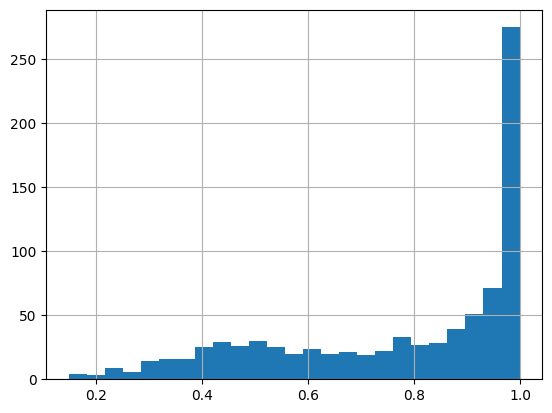

In [95]:
processed_data['proba'].hist(bins=25)

In [97]:
processed_data[processed_data['category'] == 'Экономика'][:20]

,text,category,proba
3,⭕продал POLY по 546.1 RUB\nTdmap,Экономика,0.650810
17,🟢купил SGZH по 5.822 RUB\nRostislavzzz,Экономика,0.427192
32,🟢купил CARM по 3.15 RUB\nRostislavzzz,Экономика,0.534749
35,🟢купил TGKN по 0.00932 RUB\nClickWorkk,Экономика,0.526526
40,🟢купил CHMF по 1213.6 RUB\nzhora93,Экономика,0.836727
46,🟢купил RUAL по 41.59 RUB\nVladislavzz,Экономика,0.347402
52,"**А на черной скамье, на скамье подсудимых…** ...",Экономика,0.556400
58,🟢купил NLMK по 178.2 RUB\nVyacheslavzz,Экономика,0.396459
63,🟢купил KMAZ по 207.6 RUB\nVladislavzz,Экономика,0.390520
64,🟢купил MTLR по 181.01 RUB\nVladislavzz,Экономика,0.383336


## Эксперименты

In [30]:
proba = np.array([1.20792134e-01, 4.08781140e-02, 2.60448220e-03, 1.74461782e-03,
 4.41501870e-03, 2.39749998e-03, 3.41348613e-03 ,2.21270111e-01,
 2.29588759e-01, 7.86285309e-04, 1.96854750e-03, 9.43038592e-04,
 3.56735984e-03, 1.35819265e-03, 2.05821219e-03, 8.61930970e-02,
 3.08885556e-02, 4.33357604e-03, 3.33147485e-02, 1.55521833e-04,
 5.97083804e-04, 1.43283406e-03, 2.16111196e-01, 1.86015819e-03,
 4.89403964e-04,7.88049926e-04])



top4 = np.argpartition(proba, -4)[-4:]
top1 = np.argmax(proba)
modified_array = np.delete(top4, np.where(top4 == top1))

print(modified_array)


[ 0 22  7]
